# Unrolled Optimization with Deep Priors (ODP) for Image Denoising

## 1. Introduction

### Image Denoising as an Inverse Problem

Image denoising is a classical inverse problem where we want to recover a clean image $x$ from a noisy observation $y$:

$$y = x + \epsilon$$

where $\epsilon$ is additive Gaussian noise with standard deviation $\sigma$.

### Link with Optimization

This inverse problem can be formulated as an optimization problem:

$$\min_x \frac{1}{2}\|x - y\|_2^2 + \lambda R(x)$$

where:
- $\frac{1}{2}\|x - y\|_2^2$ is the **data fidelity term** (ensures the solution stays close to observations)
- $R(x)$ is the **regularization term** (encodes prior knowledge about natural images)
- $\lambda > 0$ is the regularization parameter

### Forward-Backward Algorithm

A classical approach to solve this problem is the Forward-Backward (proximal gradient) algorithm:

$$x_{k+1} = \text{prox}_{\alpha \lambda R}\left(x_k - \alpha \nabla f(x_k)\right)$$

where $f(x) = \frac{1}{2}\|x - y\|_2^2$ (data fidelity) and $\alpha > 0$ is the step size.

For denoising: $\nabla f(x) = x - y$

### Motivation for ODP

The **Unrolled Optimization with Deep Priors (ODP)** approach replaces the fixed proximal operator with a learned CNN prior:

$$x_{k+1} = x_k - \alpha_k \nabla f(x_k) - \text{CNN}_k(x_k)$$

The key idea is to:
1. Unroll a fixed number of optimization iterations
2. Replace the proximal operator with a CNN that learns the image prior from data
3. Train the whole network end-to-end

This combines the interpretability of optimization algorithms with the expressive power of deep learning.

## 2. Imports and Setup

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import glob

import torch
import torch.nn as nn
import torch.optim as optim

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# Use CPU only
device = torch.device('cpu')
print(f"Using device: {device}")

Using device: cpu


In [2]:
def compute_psnr(clean, reconstructed):
    """
    Compute Peak Signal-to-Noise Ratio (PSNR) between two images.
    
    Args:
        clean: Ground truth image (numpy array, values in [0, 1])
        reconstructed: Reconstructed image (numpy array, values in [0, 1])
    
    Returns:
        PSNR value in dB
    """
    mse = np.mean((clean - reconstructed) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 1.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr


## 3. Data Loading and Preprocessing

We load grayscale images from the dataset with the following preprocessing:
- Convert to grayscale (single channel)
- Handle orientation: images with shape (321, 481) are rotated to match (481, 321)
- Normalize pixel values to [0, 1]
- No resizing applied

In [ ]:
def load_grayscale_image(path):
    """
    Load a single image and convert to grayscale.
    
    Args:
        path: Path to the image file
    
    Returns:
        Grayscale image as numpy array with values in [0, 1]
    """
    
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    
    if img is None:
        raise ValueError(f"Could not load image: {path}")
    
    img = img.astype(np.float32) / 255.0
    
    return img


def standardize_orientation(img):
    """
    Ensure all images have the same orientation.
    If shape is (321, 481), rotate to get (481, 321).
    
    Args:
        img: Grayscale image (H, W)
    
    Returns:
        Image with standardized orientation
    """
    h, w = img.shape
    
    
    if h == 321 and w == 481:
        
        img = np.rot90(img, k=1).copy()
    
    return img


def load_dataset(folder_path, max_images=None):
    """
    Load all images from a folder as grayscale.
    
    Args:
        folder_path: Path to folder containing images
        max_images: Maximum number of images to load (None = all)
    
    Returns:
        List of grayscale images (numpy arrays)
    """
    # Find all image files
    extensions = ['*.jpg']
    image_paths = []
    for ext in extensions:
        image_paths.extend(glob.glob(os.path.join(folder_path, ext)))
    
    if max_images is not None:
        image_paths = image_paths[:max_images]
    
    # Load images
    images = []
    for path in image_paths:
        try:
            img = load_grayscale_image(path)
            img = standardize_orientation(img)
            images.append(img)
            print(f"Loaded: {os.path.basename(path)} - Shape: {img.shape}")
        except Exception as e:
            print(f"Error loading {path}: {e}")
    
    return images

In [4]:
# Load training and test images

train_images = load_dataset("data/train", max_images=54)

test_images = load_dataset("data/test", max_images=14)

print(f"\nTotal training images: {len(train_images)}")
print(f"Total test images: {len(test_images)}")

Loaded: 101085.jpg - Shape: (481, 321)
Loaded: 101087.jpg - Shape: (481, 321)
Loaded: 102061.jpg - Shape: (481, 321)
Loaded: 103070.jpg - Shape: (481, 321)
Loaded: 105025.jpg - Shape: (481, 321)
Loaded: 106024.jpg - Shape: (481, 321)
Loaded: 108005.jpg - Shape: (481, 321)
Loaded: 108070.jpg - Shape: (481, 321)
Loaded: 108082.jpg - Shape: (481, 321)
Loaded: 109053.jpg - Shape: (481, 321)
Loaded: 119082.jpg - Shape: (481, 321)
Loaded: 12084.jpg - Shape: (481, 321)
Loaded: 123074.jpg - Shape: (481, 321)
Loaded: 126007.jpg - Shape: (481, 321)
Loaded: 130026.jpg - Shape: (481, 321)
Loaded: 134035.jpg - Shape: (481, 321)
Loaded: 14037.jpg - Shape: (481, 321)
Loaded: 143090.jpg - Shape: (481, 321)
Loaded: 145086.jpg - Shape: (481, 321)
Loaded: 147091.jpg - Shape: (481, 321)
Loaded: 148026.jpg - Shape: (481, 321)
Loaded: 148089.jpg - Shape: (481, 321)
Loaded: 157055.jpg - Shape: (481, 321)
Loaded: 159008.jpg - Shape: (481, 321)
Loaded: 160068.jpg - Shape: (481, 321)
Loaded: 16077.jpg - Shape: 

## 4. Noise Model (Denoising Problem)

We consider additive Gaussian noise:

$$y = x + n$$

where $n \sim \mathcal{N}(0, \sigma^2)$ is Gaussian noise with standard deviation $\sigma$.

In [5]:
def add_gaussian_noise(image, noise_level=0.1):
    """
    Add Gaussian noise to an image.
    
    Model: y = x + n, where n ~ N(0, sigma^2)
    
    Args:
        image: Clean grayscale image (numpy array, values in [0, 1])
        noise_level: Standard deviation (sigma) of the Gaussian noise
    
    Returns:
        Noisy image (clipped to [0, 1])
    """
    # Generate Gaussian noise with same shape as image
    noise = np.random.randn(*image.shape).astype(np.float32) * noise_level
    
    # Add noise and clip to valid range
    noisy_image = image + noise
    noisy_image = np.clip(noisy_image, 0, 1)
    
    return noisy_image

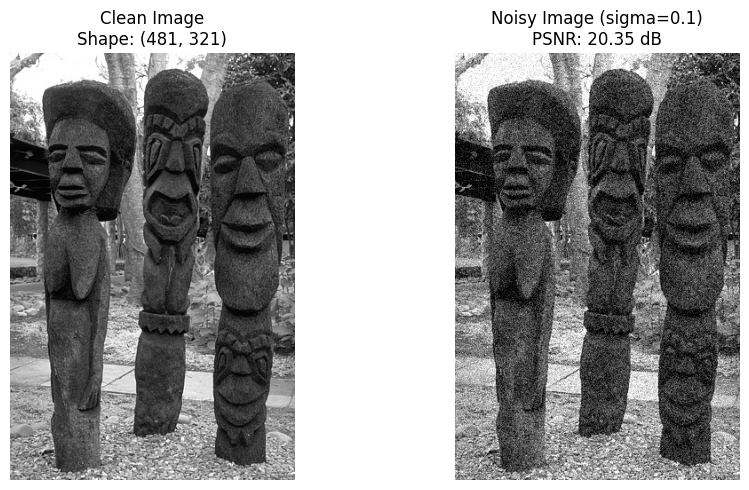

In [ ]:
# Visualize a sample image and its noisy version
noise_level = 0.1 

# Take the first training image as example
sample_image = train_images[0]
sample_noisy = add_gaussian_noise(sample_image, noise_level)

# Display
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(sample_image, cmap='gray')
axes[0].set_title(f"Clean Image\nShape: {sample_image.shape}")
axes[0].axis('off')

axes[1].imshow(sample_noisy, cmap='gray')
psnr_noisy = compute_psnr(sample_image, sample_noisy)
axes[1].set_title(f"Noisy Image (sigma={noise_level})\nPSNR: {psnr_noisy:.2f} dB")
axes[1].axis('off')

plt.tight_layout()
plt.show()

## 5. Baseline Methods

We implement two classical denoising methods to compare against ODP.

### 5.1 Gaussian Blur

Gaussian blur is a simple linear filter that smooths the image by convolving with a Gaussian kernel. It reduces noise but also blurs edges.

In [7]:
def gaussian_denoise(noisy_image, kernel_size=5):
    """
    Denoise image using Gaussian blur.
    
    This is a simple baseline that smooths the image.
    It removes noise but also blurs edges and details.
    
    Args:
        noisy_image: Noisy grayscale image (values in [0, 1])
        kernel_size: Size of the Gaussian kernel (odd number)
    
    Returns:
        Denoised image
    """
    # sigma=0 means it's computed automatically from kernel size
    denoised = cv2.GaussianBlur(noisy_image, (kernel_size, kernel_size), 0)
    return denoised

### 5.2 Forward-Backward Algorithm (ROF Model)

We implement the Forward-Backward algorithm for the ROF (Rudin-Osher-Fatemi) model:

$$\min_x \frac{1}{2}\|x - y\|_2^2 + \lambda \|\nabla x\|_1$$

where $\|\nabla x\|_1$ is the Total Variation (TV) regularization.

Using the dual formulation, the algorithm alternates:
1. **Forward step**: Gradient descent on the smooth part
2. **Backward step**: Proximal operator (projection onto constraint set)

The primal solution is recovered as: $x = y + \nabla^* z^*$ where $z^*$ is the dual solution.

In [8]:
# Gradient and adjoint operators for Forward-Backward

def grad(f):
    """
    Compute the discrete gradient of a 2D image using forward differences.
    Uses periodic boundary conditions.
    
    Args:
        f: 2D image (H, W)
    
    Returns:
        Gradient: (H, W, 2) array with horizontal and vertical derivatives
    """
    # Forward finite differences with periodic boundary conditions
    grad_x = np.roll(f, -1, axis=0) - f  # derivative in x direction (rows)
    grad_y = np.roll(f, -1, axis=1) - f  # derivative in y direction (columns)
    return np.stack([grad_x, grad_y], axis=-1)


def grad_adj(g):
    """
    Compute the adjoint of the gradient operator (negative divergence).
    
    Recall: grad* = -div
    
    Args:
        g: Gradient field (H, W, 2)
    
    Returns:
        Divergence: (H, W) array
    """
    # Backward finite differences (adjoint of forward differences)
    div_x = g[:, :, 0] - np.roll(g[:, :, 0], 1, axis=0)
    div_y = g[:, :, 1] - np.roll(g[:, :, 1], 1, axis=1)
    return -(div_x + div_y)

In [9]:
def forward_backward_denoise(noisy_image, lam=0.1, iterations=200):
    """
    Denoise image using Forward-Backward algorithm on the dual problem.
    
    We solve the ROF model:
        min_x  1/2||x - y||^2 + lambda * ||grad(x)||_1
    
    Using the dual formulation and Forward-Backward splitting.
    
    Algorithm (on dual variable z):
        1. Forward step: z = z - tau * grad(grad_adj(z) + y)
        2. Backward step: project z onto ||z||_inf <= lambda
    
    Primal recovery: x = y + grad_adj(z)
    
    Args:
        noisy_image: Noisy grayscale image y (values in [0, 1])
        lam: Regularization parameter (lambda)
        iterations: Number of iterations
    
    Returns:
        Denoised image
    """
    y = noisy_image
    
    # Step size: 1/L where L <= 8 is the Lipschitz constant of grad o grad_adj
    step_size = 0.9 / 8
    
    # Initialize dual variable z
    z = np.zeros((*y.shape, 2), dtype=np.float32)
    
    for k in range(iterations):
        # Forward step: gradient descent on smooth part
        # Gradient of f*(grad* z) = grad(grad* z + y)
        z = z - step_size * grad(grad_adj(z) + y)
        
        # Backward step: projection onto ||z||_inf <= lambda
        # This is the prox of the indicator function of the l_inf ball
        norms = np.sqrt(z[:, :, 0]**2 + z[:, :, 1]**2)
        norms = np.maximum(norms, 1e-10)  # Avoid division by zero
        factors = np.minimum(1, lam / norms)
        z[:, :, 0] = z[:, :, 0] * factors
        z[:, :, 1] = z[:, :, 1] * factors
    
    # Recover primal solution
    x_recovered = y + grad_adj(z)
    
    # Clip to valid range
    x_recovered = np.clip(x_recovered, 0, 1)
    
    return x_recovered

In [10]:
# Test baseline methods on sample image
denoised_gaussian = gaussian_denoise(sample_noisy, kernel_size=5)
denoised_fb = forward_backward_denoise(sample_noisy, lam=0.1, iterations=300)

# Compute PSNR
psnr_gaussian = compute_psnr(sample_image, denoised_gaussian)
psnr_fb = compute_psnr(sample_image, denoised_fb)

print("Classical Denoising Results:")
print(f"  Noisy image PSNR:      {psnr_noisy:.2f} dB")
print(f"  Gaussian blur PSNR:    {psnr_gaussian:.2f} dB")
print(f"  Forward-Backward PSNR: {psnr_fb:.2f} dB")

Classical Denoising Results:
  Noisy image PSNR:      20.36 dB
  Gaussian blur PSNR:    23.27 dB
  Forward-Backward PSNR: 23.61 dB


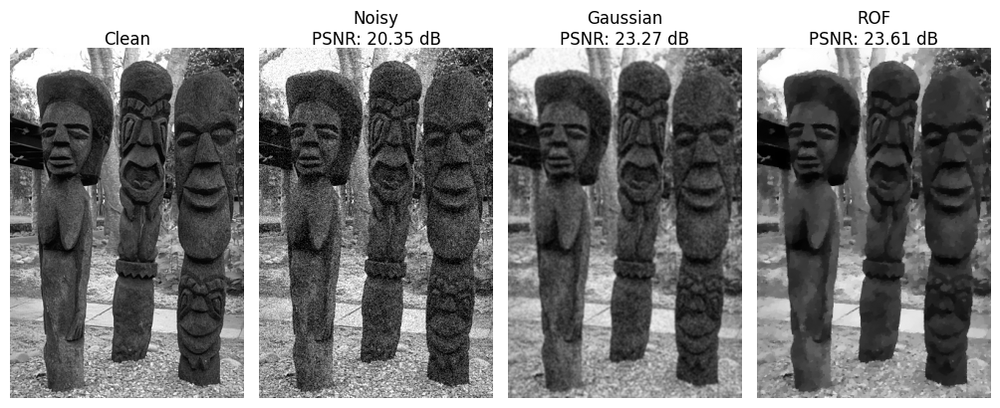

In [72]:
# Visualize results of baseline methods
fig, axes = plt.subplots(1, 4, figsize=(10, 4))

axes[0].imshow(sample_image, cmap='gray')
axes[0].set_title("Clean", pad=2)
axes[0].axis('off')

axes[1].imshow(sample_noisy, cmap='gray')
axes[1].set_title(f"Noisy\nPSNR: {psnr_noisy:.2f} dB", pad=2)
axes[1].axis('off')

axes[2].imshow(denoised_gaussian, cmap='gray')
axes[2].set_title(f"Gaussian\nPSNR: {psnr_gaussian:.2f} dB", pad=2)
axes[2].axis('off')

axes[3].imshow(denoised_fb, cmap='gray')
axes[3].set_title(f"ROF\nPSNR: {psnr_fb:.2f} dB", pad=2)
axes[3].axis('off')


plt.subplots_adjust(left=0, right=1, top=0.88, bottom=0, wspace=0)

plt.show()


## 6. CNN Prior

We implement a simple residual CNN that learns to predict a correction term. This CNN will replace the proximal operator in the Forward-Backward algorithm.

Architecture:
- Input: 1 channel grayscale image
- 10 convolutional layers with ReLU activations
- Same input/output size (using padding='same')
- Residual connection: the CNN learns the correction to subtract

In [28]:
class CNNPrior(nn.Module):
    """
    Simple residual CNN that acts as a learned prior.
    
    Architecture:
        Conv -> ReLU -> Conv -> ReLU -> Conv -> ReLU -> Conv -> ReLU -> Conv
        
    Input: Grayscale image (B, 1, H, W)
    Output: Correction term z = CNN(x) (same shape as input)
    
    The ODP update will use: x_{k+1} = x_k - alpha*(x_k - y) - CNN(x_k)
    """
    
    def __init__(self, in_channels=1, hidden_channels=64):
        """
        Initialize the CNN prior.
        
        Args:
            in_channels: Number of input channels (1 for grayscale)
            hidden_channels: Number of hidden feature channels
        """
        super(CNNPrior, self).__init__()
        
        # Layer 1: Input -> Hidden features
        self.conv1 = nn.Conv2d(in_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        
        # Layer 2: Hidden -> Hidden
        self.conv2 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        
        # Layer 3: Hidden -> Hidden
        self.conv3 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu3 = nn.ReLU()
        
        # Layer 4: Hidden -> Hidden
        self.conv4 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu4 = nn.ReLU()
        
        # Layer 5: Hidden -> Hidden
        self.conv5 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu5 = nn.ReLU()
        
        # Layer 6: Hidden -> Hidden
        self.conv6 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu6 = nn.ReLU()
        
        # Layer 7: Hidden -> Hidden
        self.conv7 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu7 = nn.ReLU()
        
        # Layer 8: Hidden -> Hidden
        self.conv8 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu8 = nn.ReLU()
        
        # Layer 9: Hidden -> Hidden
        self.conv9 = nn.Conv2d(hidden_channels, hidden_channels, kernel_size=3, padding=1)
        self.relu9 = nn.ReLU()
        
        
        # Layer 10: Hidden -> Output (correction term)
        self.conv10 = nn.Conv2d(hidden_channels, in_channels, kernel_size=3, padding=1)
        
        # Initialize weights
        self._init_weights()
    
    def _init_weights(self):
        """Initialize weights with small values for stability."""
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        """
        Forward pass: compute the correction term.
        
        Args:
            x: Input image tensor (B, 1, H, W)
        
        Returns:
            Correction term z = CNN(x) (same shape as input)
        """
        out = self.relu1(self.conv1(x))
        out = self.relu2(self.conv2(out))
        out = self.relu3(self.conv3(out))
        out = self.relu4(self.conv4(out))
        out = self.relu5(self.conv5(out))
        out = self.relu6(self.conv6(out))
        out = self.relu7(self.conv7(out))
        out = self.relu8(self.conv8(out))
        out = self.relu9(self.conv9(out))
        out = self.conv10(out)
        
        return out

In [21]:
# Test the CNN prior
test_cnn = CNNPrior(in_channels=1, hidden_channels=64).to(device)
test_input = torch.randn(1, 1, 64, 64).to(device)
test_output = test_cnn(test_input)

print("CNN Prior Architecture:")
print(f"  Input shape:  {test_input.shape}")
print(f"  Output shape: {test_output.shape}")
print(f"  Total parameters: {sum(p.numel() for p in test_cnn.parameters()):,}")

CNN Prior Architecture:
  Input shape:  torch.Size([1, 1, 64, 64])
  Output shape: torch.Size([1, 1, 64, 64])
  Total parameters: 296,641


## 7. ODP (Unrolled Optimization with Deep Priors)

The ODP network unrolls the Forward-Backward algorithm into a trainable neural network.

**Classical Forward-Backward iteration:**
$$x_{k+1} = \text{prox}_{\lambda R}\left(x_k - \alpha \nabla f(x_k)\right)$$

**ODP iteration:**
$$x_{k+1} = x_k - \alpha_k \cdot (x_k - y) - \text{CNN}_k(x_k)$$

where:
- $(x_k - y)$ is the gradient of the data fidelity term
- $\text{CNN}_k(x_k)$ replaces the proximal step with a learned prior
- $\alpha_k$ is a learnable step size

**Key insight:** The CNN learns to map noisy features to a correction that improves the image, effectively learning the regularization implicitly from data.

In [29]:
class ODPDenoising(nn.Module):
    """
    Unrolled Optimization with Deep Priors for Image Denoising.
    
    This network unrolls the proximal gradient algorithm:
        x_{k+1} = x_k - alpha_k * (x_k - y) - CNN_k(x_k)
    
    The update can be seen as:
        - Gradient step on data fidelity: -alpha_k * (x_k - y)
        - Learned prior step: -CNN_k(x_k)
    
    Each iteration k has its own:
        - CNN prior with separate weights
        - Learnable step size alpha_k
    """
    
    def __init__(self, num_iterations=5, hidden_channels=64):
        """
        Initialize the ODP network.
        
        Args:
            num_iterations: Number of unrolled iterations (K)
            hidden_channels: Number of hidden channels in CNN priors
        """
        super(ODPDenoising, self).__init__()
        
        self.num_iterations = num_iterations
        
        # Create a CNN prior for each iteration
        # Each iteration has its own CNN with separate weights
        self.cnn_priors = nn.ModuleList([
            CNNPrior(in_channels=1, hidden_channels=hidden_channels)
            for _ in range(num_iterations)
        ])
        
        # Learnable step sizes for each iteration
        # Initialize to small positive values
        self.alphas = nn.ParameterList([
            nn.Parameter(torch.tensor(0.1))
            for _ in range(num_iterations)
        ])
    
    def forward(self, y):
        """
        Forward pass: apply unrolled optimization.
        
        Algorithm:
            1. Initialize x_0 = y (start from noisy observation)
            2. For k = 0, 1, ..., K-1:
                   x_{k+1} = x_k - alpha_k * (x_k - y) - CNN_k(x_k)
            3. Return x_K
        
        Args:
            y: Noisy observation (B, 1, H, W)
        
        Returns:
            x_K: Denoised image (B, 1, H, W)
        """
        # Step 1: Initialize x_0 = y
        x = y.clone()
        
        # Step 2: Iterate through unrolled layers
        for k in range(self.num_iterations):
            # Get current step size (ensure positive)
            alpha_k = torch.abs(self.alphas[k])
            
            # Compute data fidelity gradient: (x_k - y)
            # This is the gradient of f(x) = 1/2 ||x - y||^2
            data_gradient = x - y
            
            # Compute CNN prior: z_k = CNN_k(x_k)
            z_k = self.cnn_priors[k](x)
            
            # Update step:
            # x_{k+1} = x_k - alpha_k * (x_k - y) - CNN_k(x_k)
            x = x - alpha_k * data_gradient - z_k
            
            # Clip to valid range [0, 1]
            x = torch.clamp(x, 0, 1)
        
        # Step 3: Return final estimate
        return x

In [30]:
# Create the ODP network
num_iterations = 4
odp_model = ODPDenoising(num_iterations=num_iterations, hidden_channels=64).to(device)

print("ODP Network Architecture:")
print(f"  Number of iterations: {num_iterations}")
print(f"  Total parameters: {sum(p.numel() for p in odp_model.parameters()):,}")
print(f"  Learnable step sizes: {[f'alpha_{k}' for k in range(num_iterations)]}")

ODP Network Architecture:
  Number of iterations: 4
  Total parameters: 1,186,568
  Learnable step sizes: ['alpha_0', 'alpha_1', 'alpha_2', 'alpha_3']


## 8. Training Loop

We train the ODP network with:
- Loss function: Mean Squared Error (MSE) between output and clean image
- Optimizer: Adam
- Training data: Pairs of (noisy, clean) images

In [31]:
def numpy_to_tensor(image):
    """
    Convert numpy grayscale image (H, W) to PyTorch tensor (1, 1, H, W).
    
    Args:
        image: Numpy array with shape (H, W) and values in [0, 1]
    
    Returns:
        PyTorch tensor with shape (1, 1, H, W)
    """
    # Add channel and batch dimensions: (H, W) -> (1, 1, H, W)
    tensor = torch.from_numpy(image).float().unsqueeze(0).unsqueeze(0)
    return tensor


def tensor_to_numpy(tensor):
    """
    Convert PyTorch tensor (1, 1, H, W) to numpy grayscale image (H, W).
    
    Args:
        tensor: PyTorch tensor with shape (1, 1, H, W)
    
    Returns:
        Numpy array with shape (H, W) and values in [0, 1]
    """
    # Remove batch and channel dimensions
    image = tensor.squeeze(0).squeeze(0).detach().cpu().numpy()
    # Clip to valid range
    image = np.clip(image, 0, 1)
    return image

In [32]:
def train_odp(model, train_images, num_epochs=10, noise_level=0.1, learning_rate=1e-4):
    """
    Train the ODP network on a set of images.
    
    Args:
        model: ODP network
        train_images: List of clean grayscale images (numpy arrays)
        num_epochs: Number of training epochs
        noise_level: Standard deviation of Gaussian noise
        learning_rate: Learning rate for Adam optimizer
    
    Returns:
        List of training losses per epoch
    """
    # Loss function: Mean Squared Error
    criterion = nn.MSELoss()
    
    # Optimizer: Adam
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # Training history
    losses = []
    
    print("Starting training...")
    print(f"  Number of images: {len(train_images)}")
    print(f"  Epochs: {num_epochs}")
    print(f"  Noise level: {noise_level}")
    print(f"  Learning rate: {learning_rate}")
    print("-" * 50)
    
    model.train()  # Set model to training mode
    
    for epoch in range(num_epochs):
        epoch_loss = 0.0
        
        # Process each image independently
        for img_idx, clean_image in enumerate(train_images):
            # Create noisy version (fresh noise each time)
            noisy_image = add_gaussian_noise(clean_image, noise_level)
            
            # Convert to tensors
            y = numpy_to_tensor(noisy_image).to(device)  # Noisy input
            x_true = numpy_to_tensor(clean_image).to(device)  # Ground truth
            
            # Forward pass through ODP
            optimizer.zero_grad()
            x_pred = model(y)
            
            # Compute loss: MSE(predicted, ground_truth)
            loss = criterion(x_pred, x_true)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
        
        # Average loss for this epoch
        avg_loss = epoch_loss / len(train_images)
        losses.append(avg_loss)
        
        # Print progress every few epochs
        if (epoch + 1) % 5 == 0 or epoch == 0:
            # Get current step sizes
            alphas = [torch.abs(a).item() for a in model.alphas]
            print(f"Epoch [{epoch+1:3d}/{num_epochs}] - Loss: {avg_loss:.6f} - "
                  f"Alphas: [{', '.join(f'{a:.3f}' for a in alphas)}]")
    
    print("-" * 50)
    print("Training complete!")
    
    return losses

In [38]:
# Train the model
num_epochs = 30
noise_level = 0.1

losses = train_odp(
    model=odp_model,
    train_images=train_images,
    num_epochs=num_epochs,
    noise_level=noise_level,
    learning_rate=1e-4
)

Starting training...
  Number of images: 54
  Epochs: 30
  Noise level: 0.1
  Learning rate: 0.0001
--------------------------------------------------
Epoch [  1/30] - Loss: 0.004824 - Alphas: [0.100, 0.100, 0.101, 0.101]
Epoch [  5/30] - Loss: 0.002449 - Alphas: [0.100, 0.100, 0.101, 0.102]
Epoch [ 10/30] - Loss: 0.002076 - Alphas: [0.100, 0.100, 0.101, 0.101]
Epoch [ 15/30] - Loss: 0.001967 - Alphas: [0.100, 0.100, 0.101, 0.100]
Epoch [ 20/30] - Loss: 0.001893 - Alphas: [0.100, 0.101, 0.102, 0.100]
Epoch [ 25/30] - Loss: 0.001870 - Alphas: [0.100, 0.101, 0.102, 0.099]
Epoch [ 30/30] - Loss: 0.001880 - Alphas: [0.100, 0.101, 0.102, 0.098]
--------------------------------------------------
Training complete!


In [39]:
#save the trained model
torch.save(odp_model.state_dict(), "odp_denoising_model_final.pth")


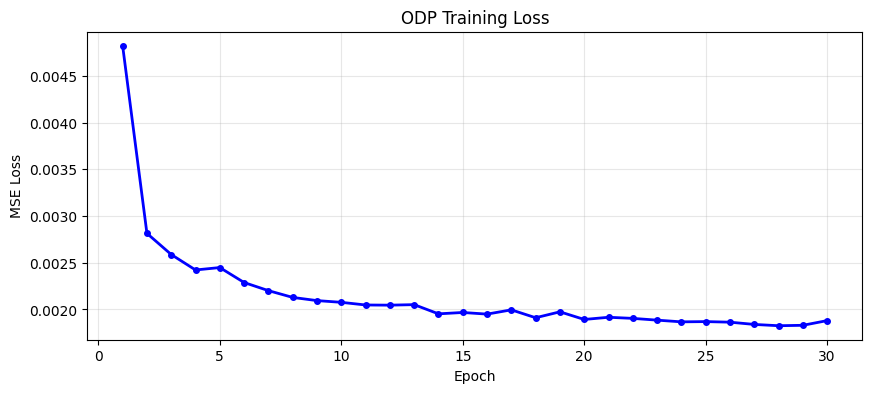


Learned step sizes (alphas):
  Iteration 1: alpha_0 = 0.1000
  Iteration 2: alpha_1 = 0.1006
  Iteration 3: alpha_2 = 0.1021
  Iteration 4: alpha_3 = 0.0977


In [40]:
# Plot training loss
plt.figure(figsize=(10, 4))
plt.plot(range(1, len(losses) + 1), losses, 'b-o', linewidth=2, markersize=4)
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('ODP Training Loss')
plt.grid(True, alpha=0.3)
plt.show()

# Print final learned step sizes
print("\nLearned step sizes (alphas):")
for k, alpha in enumerate(odp_model.alphas):
    print(f"  Iteration {k+1}: alpha_{k} = {torch.abs(alpha).item():.4f}")

## 9. Evaluation and Comparison

We evaluate all methods on the test images and compare:
1. Noisy image
2. Gaussian Blur
3. Forward-Backward (TV regularization)
4. ODP (our learned method)
5. Ground truth

Metric: Peak Signal-to-Noise Ratio (PSNR) in dB

In [41]:
def evaluate_all_methods(model, test_images, noise_level=0.1):
    """
    Evaluate all denoising methods on test images.
    
    Args:
        model: Trained ODP model
        test_images: List of clean test images
        noise_level: Standard deviation of noise
    
    Returns:
        Dictionary with results for each image
    """
    model.eval()  # Set model to evaluation mode
    
    results = []
    
    with torch.no_grad():  # No gradients needed for evaluation
        for idx, clean_image in enumerate(test_images):
            print(f"Evaluating image {idx + 1}/{len(test_images)} - Shape: {clean_image.shape}")
            
            # Create noisy version
            noisy_image = add_gaussian_noise(clean_image, noise_level)
            
            # Method 1: Gaussian blur
            gaussian_result = gaussian_denoise(noisy_image, kernel_size=5)
            
            # Method 2: Forward-Backward (TV)
            fb_result = forward_backward_denoise(noisy_image, lam=0.1, iterations=300)
            
            # Method 3: ODP denoising
            y_tensor = numpy_to_tensor(noisy_image).to(device)
            odp_result_tensor = model(y_tensor)
            odp_result = tensor_to_numpy(odp_result_tensor)
            
            # Compute PSNR values
            psnr_noisy = compute_psnr(clean_image, noisy_image)
            psnr_gaussian = compute_psnr(clean_image, gaussian_result)
            psnr_fb = compute_psnr(clean_image, fb_result)
            psnr_odp = compute_psnr(clean_image, odp_result)
            
            # Store results
            results.append({
                'clean': clean_image,
                'noisy': noisy_image,
                'gaussian': gaussian_result,
                'fb': fb_result,
                'odp': odp_result,
                'psnr_noisy': psnr_noisy,
                'psnr_gaussian': psnr_gaussian,
                'psnr_fb': psnr_fb,
                'psnr_odp': psnr_odp
            })
            
            print(f"  PSNR - Noisy: {psnr_noisy:.2f} dB | Gaussian: {psnr_gaussian:.2f} dB | "
                  f"FB: {psnr_fb:.2f} dB | ODP: {psnr_odp:.2f} dB")
    
    return results

In [116]:
# Evaluate on test images 
results = evaluate_all_methods(odp_model, test_images, noise_level=noise_level)

Evaluating image 1/14 - Shape: (481, 321)
  PSNR - Noisy: 20.02 dB | Gaussian: 29.02 dB | FB: 29.86 dB | ODP: 30.24 dB
Evaluating image 2/14 - Shape: (481, 321)
  PSNR - Noisy: 20.11 dB | Gaussian: 26.29 dB | FB: 26.56 dB | ODP: 27.90 dB
Evaluating image 3/14 - Shape: (481, 321)
  PSNR - Noisy: 20.18 dB | Gaussian: 24.51 dB | FB: 25.18 dB | ODP: 26.67 dB
Evaluating image 4/14 - Shape: (481, 321)
  PSNR - Noisy: 20.13 dB | Gaussian: 21.13 dB | FB: 21.43 dB | ODP: 23.12 dB
Evaluating image 5/14 - Shape: (481, 321)
  PSNR - Noisy: 20.14 dB | Gaussian: 26.25 dB | FB: 26.58 dB | ODP: 27.47 dB
Evaluating image 6/14 - Shape: (481, 321)
  PSNR - Noisy: 20.02 dB | Gaussian: 28.78 dB | FB: 29.88 dB | ODP: 30.02 dB
Evaluating image 7/14 - Shape: (481, 321)
  PSNR - Noisy: 20.09 dB | Gaussian: 27.93 dB | FB: 29.04 dB | ODP: 29.42 dB
Evaluating image 8/14 - Shape: (481, 321)
  PSNR - Noisy: 19.97 dB | Gaussian: 28.56 dB | FB: 29.87 dB | ODP: 30.04 dB
Evaluating image 9/14 - Shape: (481, 321)
  PSNR

In [115]:
# Summary statistics
avg_psnr_noisy = np.mean([r['psnr_noisy'] for r in results])
avg_psnr_gaussian = np.mean([r['psnr_gaussian'] for r in results])
avg_psnr_fb = np.mean([r['psnr_fb'] for r in results])
avg_psnr_odp = np.mean([r['psnr_odp'] for r in results])

print(f"Average PSNR across {len(results)} test images:")

print(f"  Noisy:            {avg_psnr_noisy:.2f} dB")
print(f"  Gaussian Blur:    {avg_psnr_gaussian:.2f} dB  (+{avg_psnr_gaussian - avg_psnr_noisy:.2f} dB)")
print(f"  Forward-Backward: {avg_psnr_fb:.2f} dB  (+{avg_psnr_fb - avg_psnr_noisy:.2f} dB)")
print(f"  ODP:              {avg_psnr_odp:.2f} dB  (+{avg_psnr_odp - avg_psnr_noisy:.2f} dB)")


Average PSNR across 14 test images:
  Noisy:            20.32 dB
  Gaussian Blur:    26.08 dB  (+5.76 dB)
  Forward-Backward: 26.72 dB  (+6.40 dB)
  ODP:              27.89 dB  (+7.58 dB)


## 10. Visualization

We display the denoising results side by side for visual comparison.

In [111]:
def visualize_results(results, num_images=3):
    """
    Visualize denoising results for multiple images.
    
    Args:
        results: List of result dictionaries
        num_images: Number of images to display
    """
    num_images = min(num_images, len(results))
    
    fig, axes = plt.subplots(num_images, 5, figsize=(14, 4 * num_images))
    
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_images):
        r = results[i]
        
        # Noisy
        axes[i, 0].imshow(r['noisy'], cmap='gray')
        if i == 0:
            axes[i, 0].set_title(f"Noisy")
        axes[i, 0].axis('off')
        
        # Gaussian Blur
        axes[i, 1].imshow(r['gaussian'], cmap='gray')
        if i == 0:
            axes[i, 1].set_title(f"Gaussian Blur")
        axes[i, 1].axis('off')
        
        # Forward-Backward
        axes[i, 2].imshow(r['fb'], cmap='gray')
        if i == 0:
            axes[i, 2].set_title(f"ROF")
        axes[i, 2].axis('off')
        
        # ODP
        axes[i, 3].imshow(r['odp'], cmap='gray')
        if i == 0:  
            axes[i, 3].set_title(f"ODP")
        axes[i, 3].axis('off')
        
        # Ground Truth
        axes[i, 4].imshow(r['clean'], cmap='gray')
        if i == 0: 
            axes[i, 4].set_title("Ground Truth")
        axes[i, 4].axis('off')
    
   
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.002, hspace=0.02)

    plt.show()

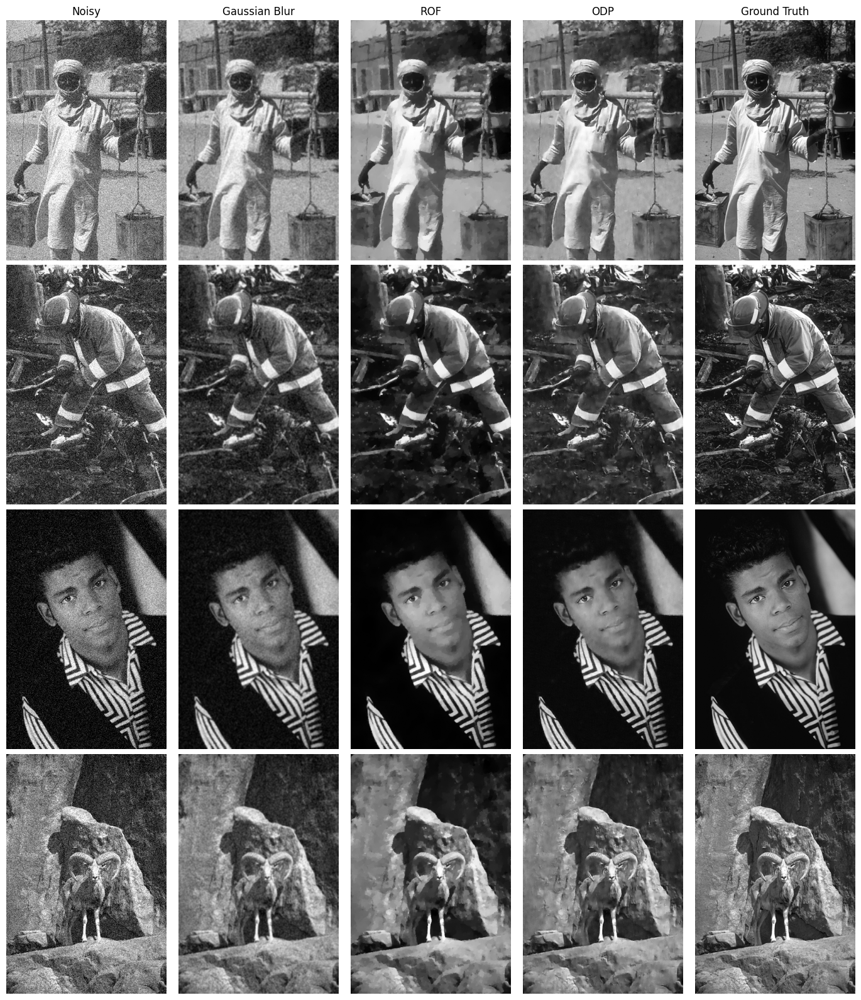

In [ ]:
visualize_results([results[i] for i in [1, 2, 9, 11]], num_images=4)

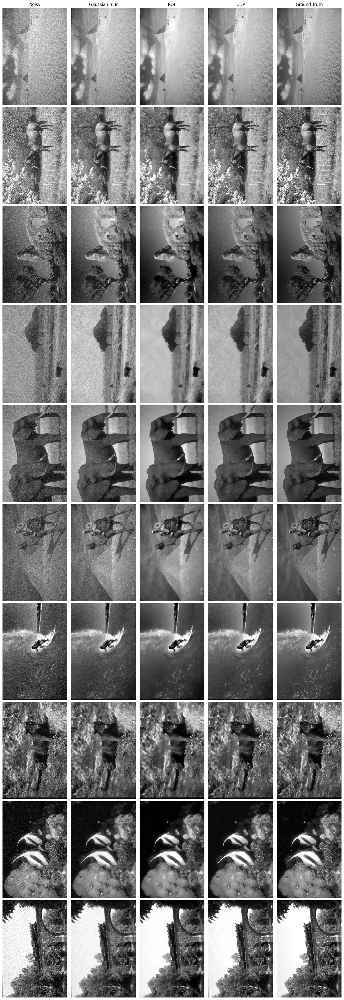

In [125]:
visualize_results([results[i] for i in [0, 3, 4, 5, 6, 7, 8, 10, 12,13]], num_images=10)

In [ ]:
results_smaller_noisy = evaluate_all_methods(odp_model, test_images, noise_level=0.05)
results_medium_noisy = evaluate_all_methods(odp_model, test_images, noise_level=0.15)
results_large_noisy = evaluate_all_methods(odp_model, test_images, noise_level=0.20)
results_larger_noisy = evaluate_all_methods(odp_model, test_images, noise_level=0.25)

Evaluating image 1/14 - Shape: (481, 321)
  PSNR - Noisy: 16.67 dB | Gaussian: 26.65 dB | FB: 28.01 dB | ODP: 24.23 dB
Evaluating image 2/14 - Shape: (481, 321)
  PSNR - Noisy: 16.78 dB | Gaussian: 24.87 dB | FB: 25.33 dB | ODP: 23.37 dB
Evaluating image 3/14 - Shape: (481, 321)
  PSNR - Noisy: 16.96 dB | Gaussian: 23.52 dB | FB: 24.33 dB | ODP: 23.07 dB
Evaluating image 4/14 - Shape: (481, 321)
  PSNR - Noisy: 16.76 dB | Gaussian: 20.60 dB | FB: 21.19 dB | ODP: 20.94 dB
Evaluating image 5/14 - Shape: (481, 321)
  PSNR - Noisy: 16.80 dB | Gaussian: 24.83 dB | FB: 25.61 dB | ODP: 23.30 dB
Evaluating image 6/14 - Shape: (481, 321)
  PSNR - Noisy: 16.54 dB | Gaussian: 26.48 dB | FB: 27.88 dB | ODP: 23.88 dB
Evaluating image 7/14 - Shape: (481, 321)
  PSNR - Noisy: 16.75 dB | Gaussian: 26.01 dB | FB: 27.29 dB | ODP: 23.95 dB
Evaluating image 8/14 - Shape: (481, 321)
  PSNR - Noisy: 16.55 dB | Gaussian: 26.40 dB | FB: 27.89 dB | ODP: 23.82 dB
Evaluating image 9/14 - Shape: (481, 321)
  PSNR

In [123]:
# Compare average PSNRs at different noise levels 0.05, 0.1, 0.15,0.20,0.25
def compute_average_psnrs(results):
    avg_psnr_noisy = np.mean([r['psnr_noisy'] for r in results])
    avg_psnr_gaussian = np.mean([r['psnr_gaussian'] for r in results])
    avg_psnr_fb = np.mean([r['psnr_fb'] for r in results])
    avg_psnr_odp = np.mean([r['psnr_odp'] for r in results])
    return avg_psnr_noisy, avg_psnr_gaussian, avg_psnr_fb, avg_psnr_odp

avg_psnr_smaller = compute_average_psnrs(results_smaller_noisy)
avg_psnr_small = compute_average_psnrs(results)
avg_psnr_medium = compute_average_psnrs(results_medium_noisy)
avg_psnr_large = compute_average_psnrs(results_large_noisy)
avg_psnr_larger = compute_average_psnrs(results_larger_noisy)

print("\nAverage PSNRs at different noise levels:")
print("Noise Level |   Noisy   | Gaussian |   FB    |   ODP  | Improvement " )
print("----------------------------------------------------------------------")
print(f"  0.05     | {avg_psnr_smaller[0]:8.3f} | {avg_psnr_smaller[1]:8.3f} | {avg_psnr_smaller[2]:8.3f} | {avg_psnr_smaller[3]:8.3f} | {avg_psnr_smaller[3]-avg_psnr_smaller[1]:.2f} dB")
print(f"  0.10     | {avg_psnr_small[0]:8.3f} | {avg_psnr_small[1]:8.3f} | {avg_psnr_small[2]:8.3f} | {avg_psnr_small[3]:8.3f} | {avg_psnr_small[3]-avg_psnr_small[1]:.2f} dB")
print(f"  0.15     | {avg_psnr_medium[0]:8.3f} | {avg_psnr_medium[1]:8.3f} | {avg_psnr_medium[2]:8.3f} | {avg_psnr_medium[3]:8.3f} | {avg_psnr_medium[3]-avg_psnr_medium[1]:.2f} dB")
print(f"  0.20     | {avg_psnr_large[0]:8.3f} | {avg_psnr_large[1]:8.3f} | {avg_psnr_large[2]:8.3f} | {avg_psnr_large[3]:8.3f} | {avg_psnr_large[3]-avg_psnr_large[1]:.2f} dB")
print(f"  0.25     | {avg_psnr_larger[0]:8.3f} | {avg_psnr_larger[1]:8.3f} | {avg_psnr_larger[2]:8.3f} | {avg_psnr_larger[3]:8.3f} | {avg_psnr_larger[3]-avg_psnr_larger[1]:.2f} dB")


Average PSNRs at different noise levels:
Noise Level |   Noisy   | Gaussian |   FB    |   ODP  | Improvement 
----------------------------------------------------------------------
  0.05     |   26.203 |   27.537 |   27.074 |   28.434 | 0.90 dB
  0.10     |   20.319 |   26.069 |   26.711 |   27.876 | 1.81 dB
  0.15     |   16.976 |   24.482 |   25.338 |   23.436 | -1.05 dB
  0.20     |   14.730 |   23.019 |   22.728 |   19.224 | -3.79 dB
  0.25     |   13.104 |   21.728 |   20.202 |   16.803 | -4.93 dB


## 11. Conclusion

ODP benefits from the interpretability of optimization algorithms, it has better performance when the level noise is not far from the level noise used the training. 

### Limitations that I noticed

- Training requires pairs of clean and noisy images
- Performance depends on the noise level used during training
- Limited training data and epochs in this educational example
